In [ ]:
import sys
sys.path.append('..')

import pandas as pd
import flood_tool as ft

### Get the predicted houseprices data

In [ ]:
unlabeled = ft.utils.read_csv_from_example_data('postcodes_unlabelled.csv')
 
postcodes = unlabeled['postcode'].tolist()
 
df_houseprices = ft.price_proc.predict_house_price_from_postcodes_df(postcodes)
 
display(df_houseprices.head())

### Get the predicted risk label data

In [ ]:
import pandas as pd
import numpy as np
from flood_tool.models.seven_class_probability import SevenClassProbability

# Load model
model = SevenClassProbability.load()
pipe = model.pipeline
preprocessor = pipe.named_steps["preprocessor"]

# Load input data
df = pd.read_csv("../flood_tool/resources/preprocessed_data/example_data_preprocessed/postcodes_missing_data_imputed.csv")

# Remove stray columns
for col in ['Unnamed: 0_x', 'Unnamed: 0_y']:
    if col not in df.columns:
        df[col] = 0
df = df.drop(columns=['Unnamed: 0_x', 'Unnamed: 0_y'], errors='ignore')

# Ensure columns match model training columns
numeric_cols = preprocessor.transformers_[0][2]
categorical_cols = preprocessor.transformers_[1][2]
needed_cols = list(numeric_cols) + list(categorical_cols)

for col in needed_cols:
    if col not in df.columns:
        df[col] = np.nan

# Keep only required columns
df = df.replace({pd.NA: np.nan})
df = df[needed_cols]

# Predict
df_pred_risk = model.predict_dataframe(df)

### Visualising predicted risk class and predicted houseprices

Below is a plot of the predicted risk labels for each postcode, with the marker size corresponding to risk classification. This plot visualises areas of potential flood risk.

Note: Screen shot of the output is provided in case it does not show when run

In [ ]:
from flood_tool.visualization.mapping import plot_color_size_map, filtered_plot, plot_latest_weather_data, plot_latest_rainfall_and_level

In [ ]:
plot_color_size_map(df_pred_risk, "predictedRisk")

Below is additional maps for predicted median house prices for each postcode. 

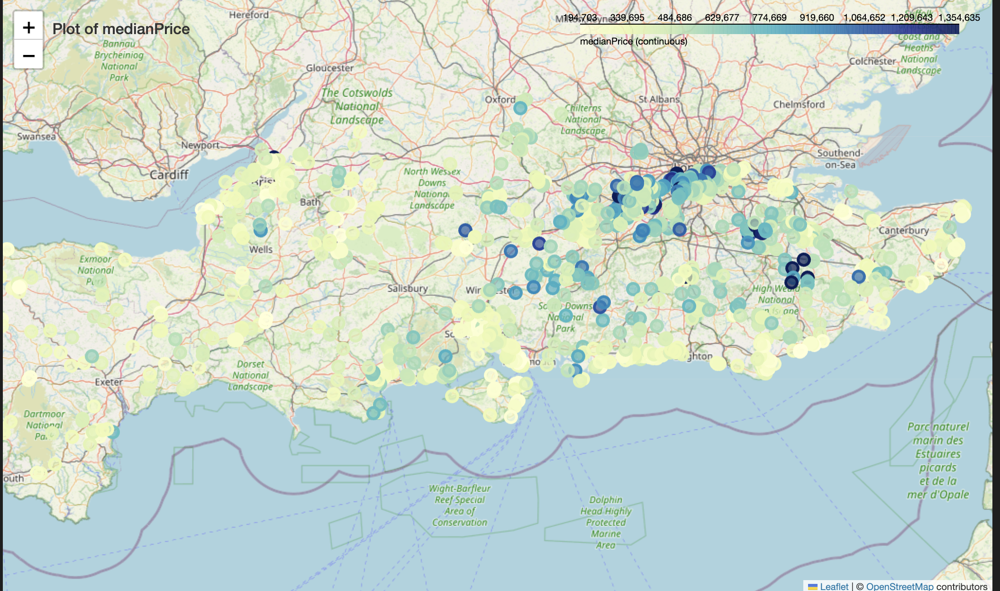

In [ ]:
plot_color_size_map(df_houseprices, feature="medianPrice")

Below is a filtered version of the risk plot, showing areas with predicted median house price >= 500,000. This helps identify areas of poential high financial property risk. Comparing this with the plotted risk map, we can see which areas have potentially big financial impact.

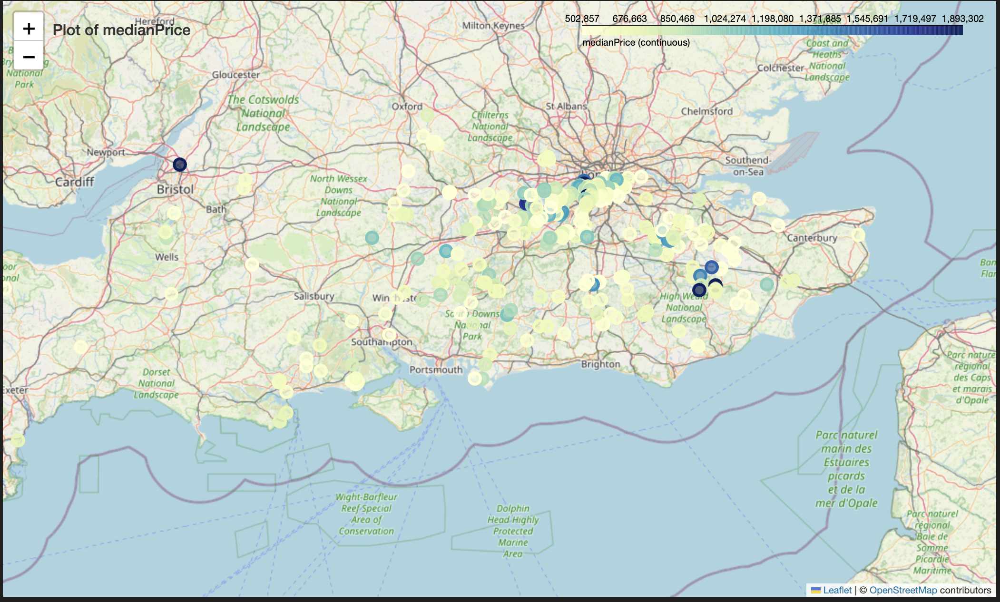

In [ ]:
filtered_plot(df_houseprices, feature1="medianPrice", feature1_min=500000)

Below plots a filtered plot with predicted median house prices >= £500,000 and distance to watercourses <= 250m. The colour represents the price and the size of the marker scales with how close the postcode is to the watercourse. This highlights areas with postcodes with potential financial risk from flooding from nearby watercourses.

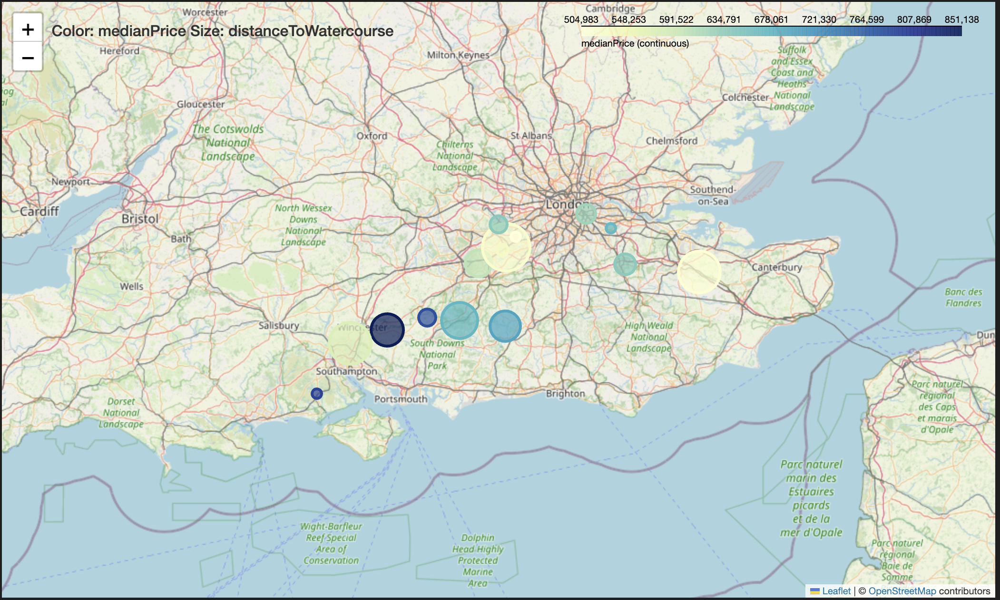

In [ ]:
filtered_plot(df_houseprices, feature1="medianPrice", feature2="distanceToWatercourse",
                  feature1_min=500000, feature1_max=None,
                  feature2_min=None, feature2_max=250, invert_size=True)

### Plots for weather data

In [ ]:
df_level_station = pd.read_csv('../flood_tool/resources/preprocessed_data/level_stations_no_impute.csv')
df_level_station.head()

Below plots maximum recorded river levels (>=5) for each station. This visualises reas with potential high river levels.

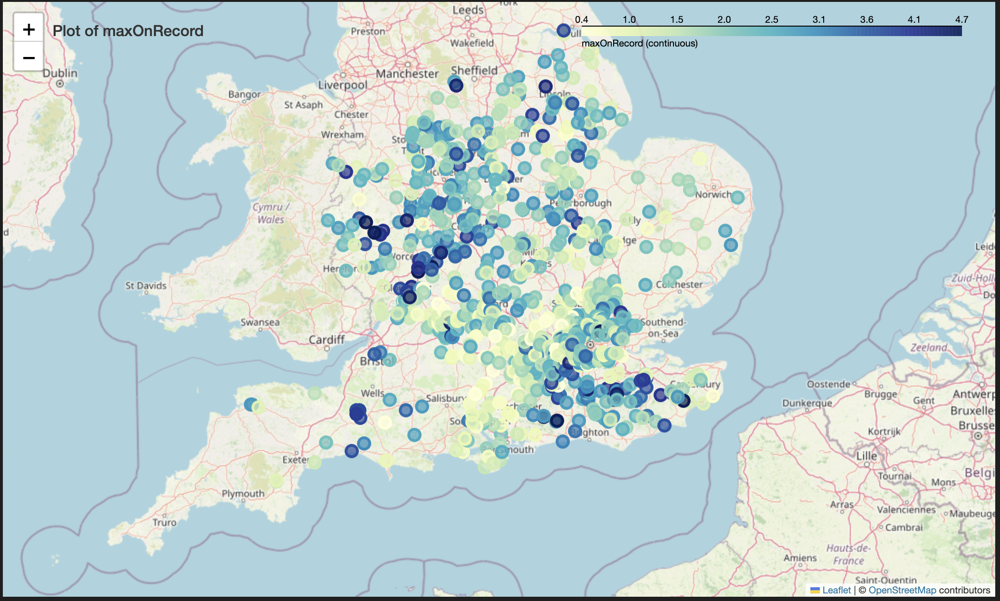

In [ ]:
filtered_plot(df_level_station, feature1="maxOnRecord",
                  feature1_max=5)

Below plots the latest weather data for each station. One is for rainfall, and other is for river level. The data used was combined to include the station reference, datetime, corrdinates, the parameter and its value via preprocessing.

In [ ]:
df_weather = pd.read_csv('../flood_tool/resources/preprocessed_data/example_data_preprocessed/wet_day_preprocessed.csv')
df_weather.head()

Below plots both the latest levels and rainfall measurements for each station.

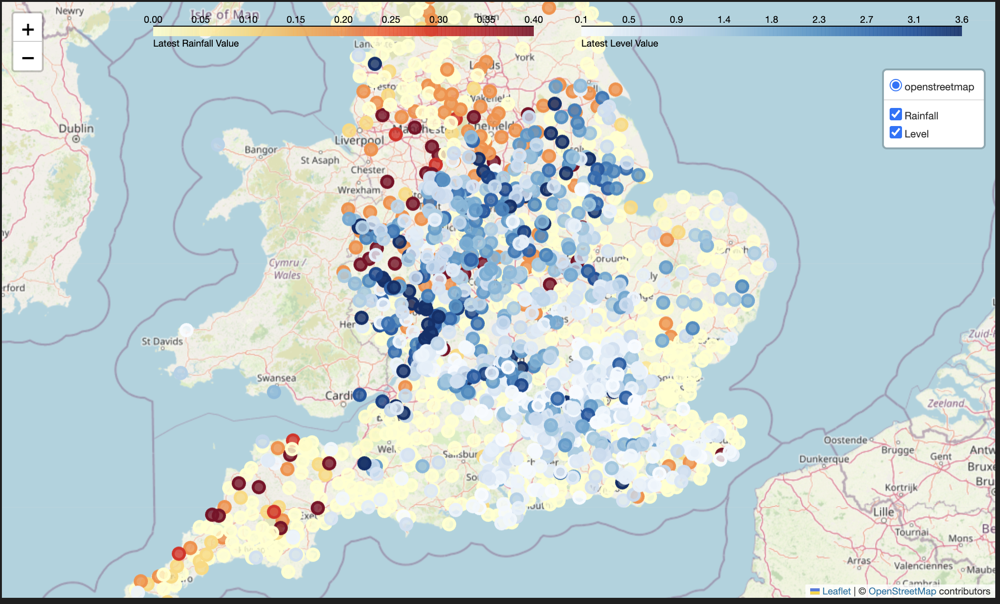

In [ ]:
plot_latest_rainfall_and_level(df_weather)